### Instalacja niezbędnych bibliotek

Ta komenda przygotowuje środowisko do pracy z obrazami

In [33]:
%pip install matplotlib scikit-image opencv-python numpy

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Podstawowy kod z repozytorium


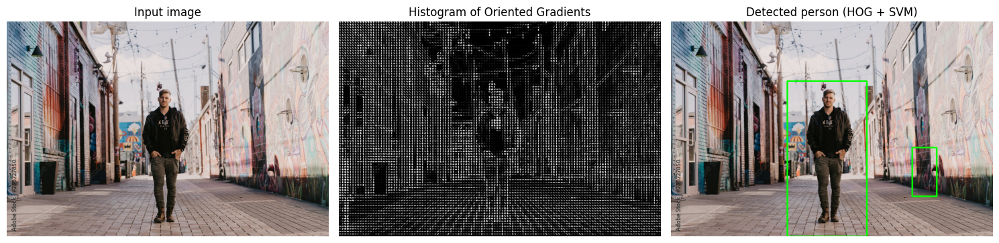

array([[361, 186, 247, 481],
       [749, 392,  76, 151]], dtype=int32)

In [34]:
from src.s1 import s1

s1("./images/zdj.jpg")

### Demo: Sliding Window

Ten kod robi tak naprawdę dwie rzeczy na krzyż:

1. **Animacja poglądowa:** Skrypt jeździ po zdjęciu zdefiniowaną ramką (64x128 px) w dwóch skalach i odświeża obraz. Pokazuje krok po kroku, jak algorytm analizuje układ krawędzi w lokalnych obszarach.
2. **Faktyczna detekcja i podsumowanie:** Potem kod odpala gotowy detektor OpenCV, który namierza ludzi i stawia na nich zielone prostokąty. Na sam koniec wypluwa obok siebie trzy klatki: oryginał, mapę HOG dla całości i gotowy wynik z ramkami.

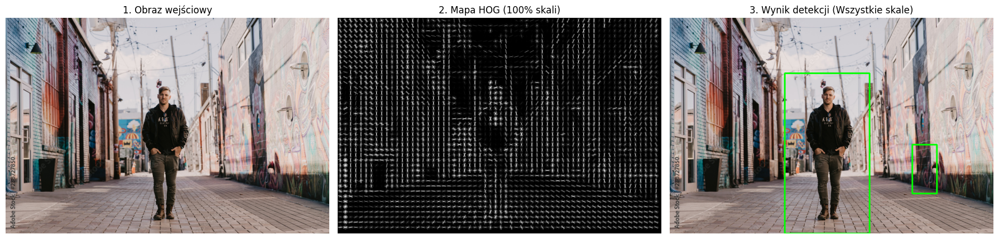

In [35]:
from src.s2 import s2

s2("./images/zdj.jpg")

### Parametry HOG

Poniższe eksperymenty pokazują jak zmiana parametrów wpływa na wygląd i rozmiar deskryptora HOG.

**1: Liczba orientacji (4, 9, 18)**  
Mała liczba orientacji jak 4 za bardzo upraszcza gradient, sylwetka jest nieczytelna. Duża, czyli 18 daje szczegółowy obraz, ale wektor cech robi się bardzo duży. Wartość 9 to dobry kompromis.

**2: Rozmiar komórki (4×4, 8×8, 16×16 px)**  
Małe komórki 4×4 łapią za dużo szumu. Duże 16×16 tracą istotne detale. Rozmiar 8×8 działa najlepiej pod względem jakości i wydajności.

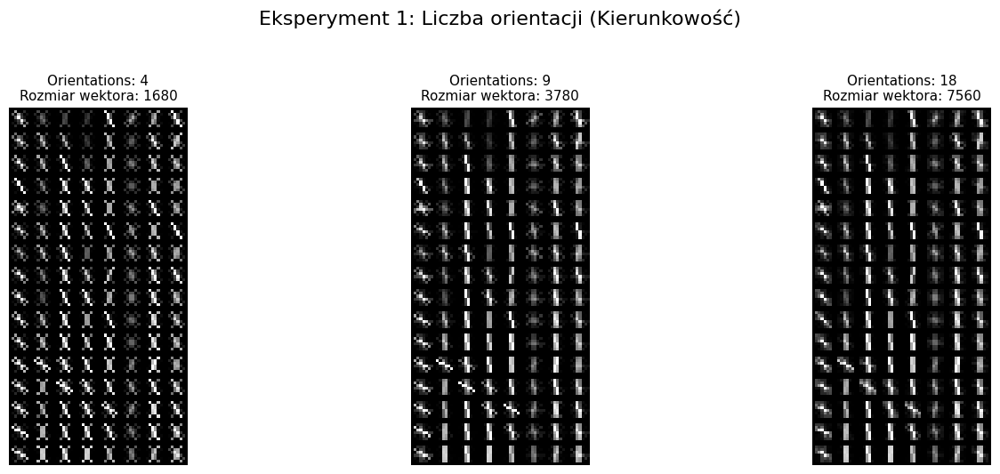

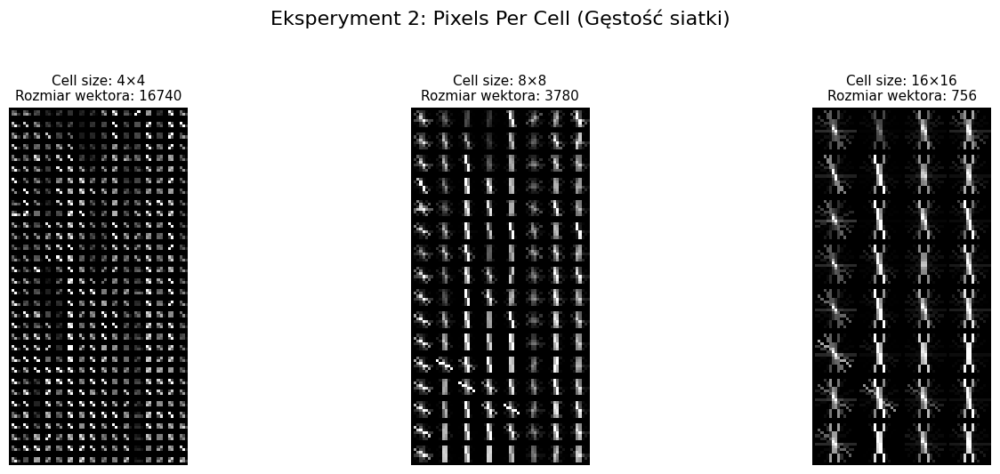

In [36]:
from src.s3 import s3

s3("./images/zdj.jpg")

Rozmiar komórki
* Cel: Sprawdzenie, jak szczegółowy musi być opis sylwetki, żeby algorytm wiedział, że to człowiek
* Eksperyment: Porównujemy duże komórki 16x16 z małymi 8x8 pod kątem wyglądu szkieletu krawędzi i długości danych
* Wniosek: Mniejsze komórki dają świetny detal, ale generują ogromną ilość danych, co spowalnia proces i nie zawsze poprawia samą detekcję

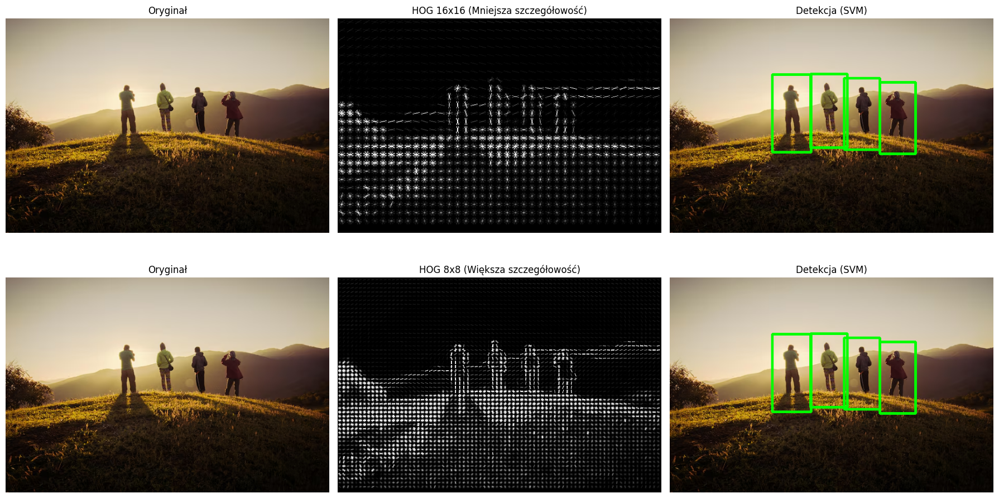

Długość wektora cech (16x16): 7800
Długość wektora cech (8x8):   31824


In [37]:
from src.s4 import s4

s4("./images/ppl.avif")

Rozmiar komórki i skalowanie
* Cel: Zbadanie, jak rozmiar komórki i skala wpływają na skuteczność wykrywania sylwetek
* Eksperyment: Porównujemy dwa podejścia: duże komórki 16x16 z gęstym skanowaniem oraz małe komórki 8x8 z rzadkim skanowaniem piramidy obrazu
* Wniosek: Zagęszczenie siatki 8x8 poprawia detal, ale drastycznie wydłuża dane. Z kolei zbyt duży skok skali x1.2 przyspiesza działanie, ale zwiększa ryzyko pominiecia osób na zdjęciu

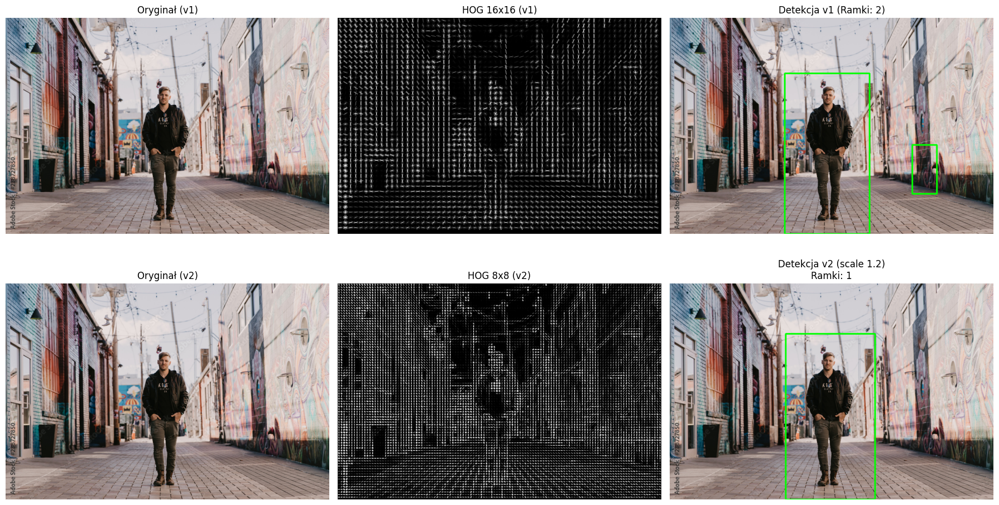

Długość wektora 16x16: 20336
Długość wektora 8x8:   83000


In [38]:
from src.s5 import s5

s5("./images/zdj.jpg")

Parametry okna i piramidy
* Cel: Znalezienie balansu między prędkością działania a dokładnością namierzania obiektów
* Eksperyment: Testujemy różne skoki okna i gęstość skalowania obrazu, mierząc czas operacji i liczbę trafień
* Wniosek: Gęste skanowanie jest bardzo dokładne, ale zabójczo wolne; z kolei duże skoki okna są błyskawiczne, ale często przeskakują nad ludźmi

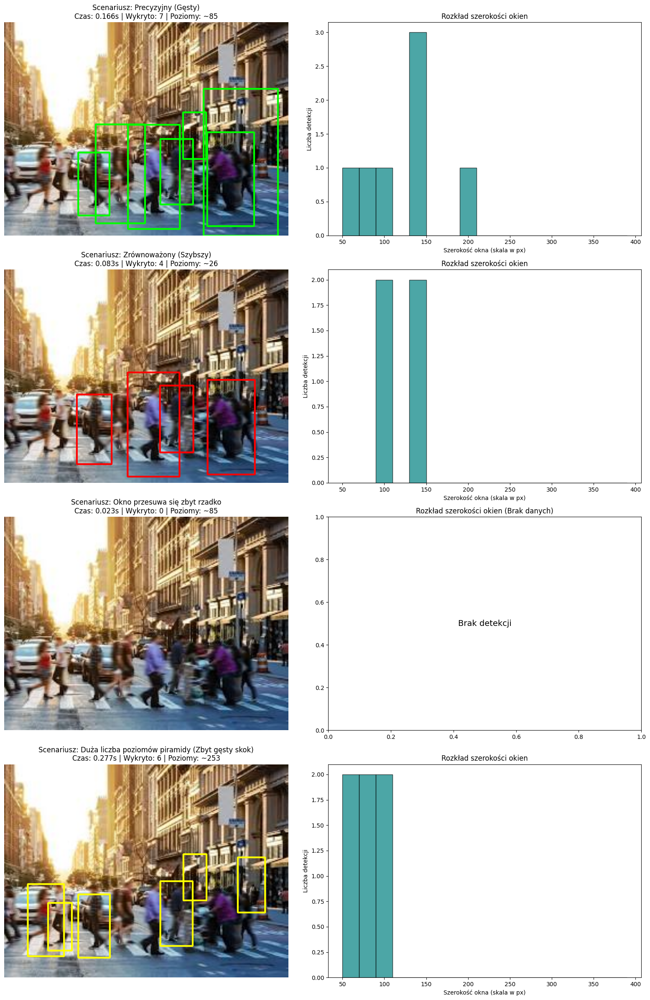

In [39]:
from src.s6 import s6

s6("./images/zdj2.jfif")

Rozmycie Gaussa
* Cel: Zbadanie, jak bardzo można popsuć jakość obrazu, aby detekcja nadal działała poprawnie
* Eksperyment: Stopniowo rozmywamy zdjęcie filtrem Gaussa i obserwujemy moment, w którym krawędzie HOG stają się zbyt plastyczne dla klasyfikatora
* Wniosek: Algorytm jest odporny na małe rozmycie, ale przy większej mgle kluczowe gradienty znikają i detekcja całkowicie pada

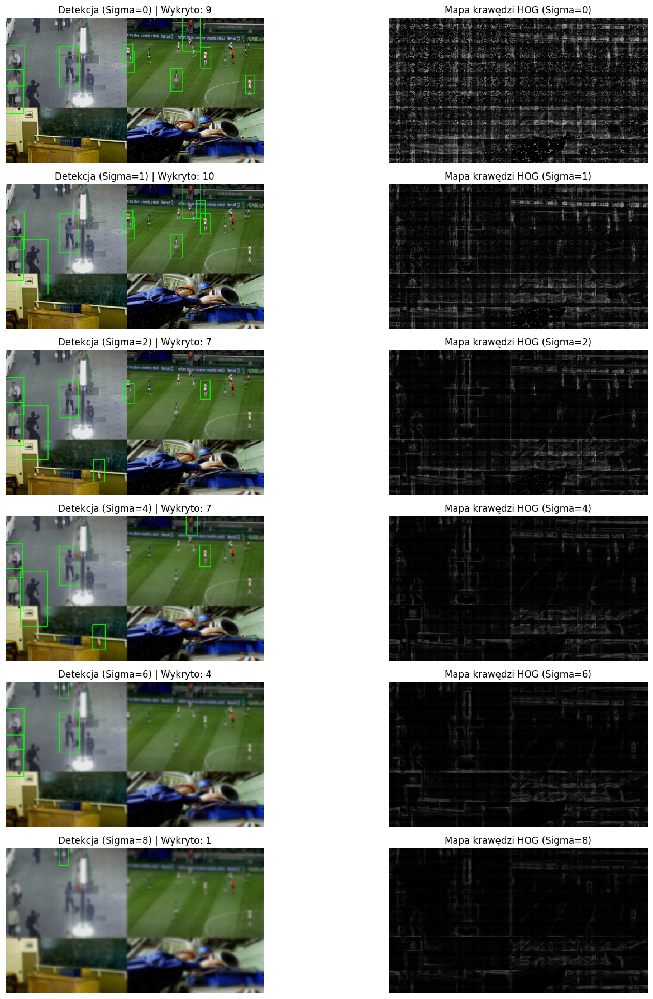

In [40]:
from src.s7 import s7

s7("./images/zdj2.jpg")

Korekcja Gamma
* Cel: Sprawdzenie, czy sztuczne rozjaśnienie lub przyciemnienie zdjęcia pomoże algorytmowi zobaczyć ludzi w trudnych warunkach oświetleniowych
* Eksperyment: Nakładamy różne filtry jasności Gamma i patrzymy, jak zmienia się mapa krawędzi oraz skuteczność detektora
* Wniosek: Odpowiednie rozjaśnienie wydobywa sylwetki z cienia, ale przesada niszczy kontrast i tworzy szum, co oślepia algorytm

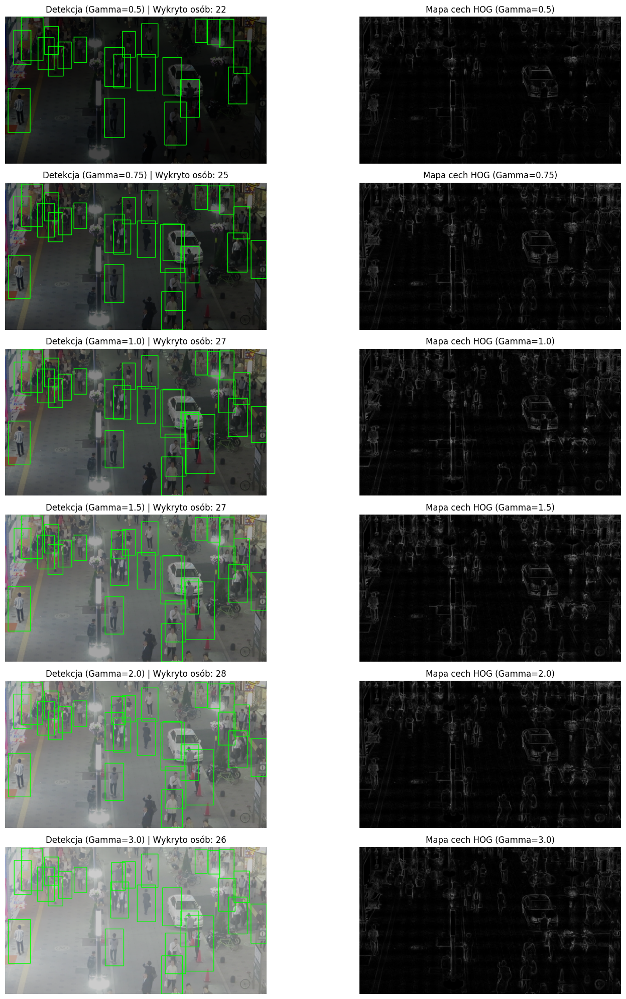

In [41]:
from src.s8 import s8

s8("./images/tlum2.png")